# Feature Engineering - Gemstone Price Prediction

In [1]:
# data manipulation and plotting
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from autoviz.AutoViz_Class import AutoViz_Class


# for saving the pipeline
import joblib

# from Scikit-learn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, Binarizer

# from feature-engine
from feature_engine.encoding import (
    RareLabelEncoder,
    OrdinalEncoder,
)

from feature_engine.creation import MathFeatures
from feature_engine.selection import DropCorrelatedFeatures

from feature_engine.transformation import (
    YeoJohnsonTransformer,
)

from feature_engine.selection import DropFeatures
from feature_engine.wrappers import SklearnTransformerWrapper

# to visualise al the columns in the dataframe
pd.pandas.set_option('display.max_columns', None)

# os
import os
from os.path import join

Imported v0.1.58. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


In [2]:
os.getcwd() # current directory

'C:\\Users\\ivan_\\Desktop\\projects\\playground_series_gemstone_price_dataset\\notebooks'

## Setting paths

In [3]:
root_dir = r'C:\\Users\\ivan_\\Desktop\\projects\\playground_series_gemstone_price_dataset' # set rot dir to project dir
os.chdir(root_dir)
os.getcwd()

'C:\\Users\\ivan_\\Desktop\\projects\\playground_series_gemstone_price_dataset'

In [4]:
# Data paths
os.listdir(join(root_dir,"data"))

['.gitignore',
 'data_dictionary.xlsx',
 'sample_submission.csv',
 'selected_feat.csv',
 'submissions',
 'test.csv',
 'test.csv.dvc',
 'test_prepared_feat_eng.csv',
 'train.csv',
 'train.csv.dvc',
 'train_prepared_feat_eng.csv']

In [5]:
data_train_path = join(root_dir,"data","train.csv")
data_test_path = join(root_dir,"data","test.csv")
data_dict_path = join(root_dir,"data","data_dictionary.xlsx")

## Loading The Data

In [6]:
df_train = pd.read_csv(data_train_path)
df_test = pd.read_csv(data_test_path)
data_dict = pd.read_excel(data_dict_path)

In [7]:
df_train.head()

,id,carat,cut,color,clarity,depth,table,x,y,z,price
0,0,1.52,Premium,F,VS2,62.2,58.0,7.27,7.33,4.55,13619
1,1,2.03,Very Good,J,SI2,62.0,58.0,8.06,8.12,5.05,13387
2,2,0.70,Ideal,G,VS1,61.2,57.0,5.69,5.73,3.50,2772
3,3,0.32,Ideal,G,VS1,61.6,56.0,4.38,4.41,2.71,666
4,4,1.70,Premium,G,VS2,62.6,59.0,7.65,7.61,4.77,14453


In [8]:
df_test.head()

,id,carat,cut,color,clarity,depth,table,x,y,z
0,193573,0.35,Ideal,D,VS2,62.3,56.0,4.51,4.54,2.82
1,193574,0.77,Very Good,F,SI2,62.8,56.0,5.83,5.87,3.68
2,193575,0.71,Ideal,I,VS2,61.9,53.0,5.77,5.74,3.55
3,193576,0.33,Ideal,G,VVS2,61.6,55.0,4.44,4.42,2.73
4,193577,1.20,Very Good,I,VS2,62.7,56.0,6.75,6.79,4.24


In [9]:
data_dict

,Variable Name,Description
0,Carat,Carat weight of the cubic zirconia.
1,Cut,"Describe the cut quality of the cubic zirconia. Quality is increasing order Fair, Good, Very Good, Premium, Ideal."
2,Color,Colour of the cubic zirconia.With D being the best and J the worst.
3,Clarity,"cubic zirconia Clarity refers to the absence of the Inclusions and Blemishes. (In order from Best to Worst, FL = flawless, I3= level 3 inclusions) FL, IF, VVS1, VVS2, VS1, VS2, SI1, SI2, I1, I2, I3"
4,Depth,"The Height of a cubic zirconia, measured from the Culet to the table, divided by its average Girdle Diameter."
5,Table,The Width of the cubic zirconia's Table expressed as a Percentage of its Average Diameter.
6,Price,the Price of the cubic zirconia.
7,X,Length of the cubic zirconia in mm.
8,Y,Width of the cubic zirconia in mm.
9,Z,Height of the cubic zirconia in mm.


## Setting The Seed

In [10]:
SEED = 8274
np.random.seed(SEED)

In [11]:
X, y = df_train.drop(columns = ["id","price"]).copy(), df_train["price"].copy()

## Feature Engineering

### Numerical Variable transformation

In [12]:
numeric_var_to_trans = ["carat"]

yeo_transformer = YeoJohnsonTransformer(
        variables = numeric_var_to_trans)

X = yeo_transformer.fit_transform(X)

### join rare label

In [13]:
X["clarity"].value_counts()

SI1     53272
VS2     48027
VS1     30669
SI2     30484
VVS2    15762
VVS1    10628
IF       4219
I1        512
Name: clarity, dtype: int64

In [14]:
X = X.replace("I1","SI2").replace("SI2","SI2andI1")

### Categorical Variables

In [15]:
color_mappings = {"D":1, "E":2, "F":3, "G":4, "H":5, "I":6, "J":7}

X["color"] = X["color"].map(color_mappings)

In [16]:
cut_mappings = {"Fair":1, "Good":2, "Very Good":3, "Premium":5, "Ideal":6}

X["cut"] = X["cut"].map(cut_mappings)

In [17]:
clarity_mappings = {"IF":1, "VVS1":2, "VVS2":3, "VS1":4, "VS2":5,
                    "SI1":6, "SI2andI1":7}

X["clarity"] = X["clarity"].map(clarity_mappings)

In [18]:
X.head()

,carat,cut,color,clarity,depth,table,x,y,z
0,0.555290,5,3,5,62.2,58.0,7.27,7.33,4.55
1,0.609005,3,7,7,62.0,58.0,8.06,8.12,5.05
2,0.391096,6,4,4,61.2,57.0,5.69,5.73,3.50
3,0.235654,6,4,4,61.6,56.0,4.38,4.41,2.71
4,0.576819,5,4,5,62.6,59.0,7.65,7.61,4.77


## Impute Missing Values

In [19]:
X[["x","y","z"]].describe()

,x,y,z
count,193573.000000,193573.000000,193573.000000
mean,5.715312,5.720094,3.534246
std,1.109422,1.102333,0.688922
min,0.000000,0.000000,0.000000
25%,4.700000,4.710000,2.900000
50%,5.700000,5.720000,3.530000
75%,6.510000,6.510000,4.030000
max,9.650000,10.010000,31.300000


In [25]:
X[X.x > 0]["x"].sort_values()[:5] # inf limit 3.75

102173    3.75
73130     3.75
142429    3.77
123075    3.77
173184    3.77
Name: x, dtype: float64

In [28]:
X[X.x == 0]

,carat,cut,color,clarity,depth,table,x,y,z
92703,0.394163,2,3,6,64.1,60.0,0.0,0.00,0.0
170318,0.394163,2,1,5,64.1,60.0,0.0,0.00,0.0
178000,0.394163,3,3,7,62.0,60.0,0.0,6.71,0.0


In [32]:
# index where we can impute x with y
idx_impute_x_with_y = X[(X.x == 0) & (X.y != 0)].index

In [38]:
X[X.y > 0]["y"].sort_values()[:5] # inf limit 3.71

73130     3.71
142429    3.72
42212     3.72
123075    3.72
33806     3.72
Name: y, dtype: float64

In [39]:
X[X.y == 0]

,carat,cut,color,clarity,depth,table,x,y,z
92703,0.394163,2,3,6,64.1,60.0,0.0,0.0,0.0
170318,0.394163,2,1,5,64.1,60.0,0.0,0.0,0.0


In [42]:
X[(X.x == 0)&(X.y == 0)]

,carat,cut,color,clarity,depth,table,x,y,z
92703,0.394163,2,3,6,64.1,60.0,0.0,0.0,0.0
170318,0.394163,2,1,5,64.1,60.0,0.0,0.0,0.0


### Imputing missing x

In [35]:
X.loc[idx_impute_x_with_y,"x"] = X.loc[idx_impute_x_with_y,"y"]

### Imputing missing x and y

In [58]:
for idx in X[(X.x == 0)&(X.y == 0)].index:
    carat, cut, color, clarity, depth = X.loc[idx,["carat","cut","color","clarity","depth"]]
    x_mean, y_mean = X[(X["carat"] == carat) & (X["cut"] == int(cut)) & 
               (X["color"] == int(color)) & (X["clarity"] == int(clarity))][X.x > 0][["x","y"]].mean()
    X.loc[idx,["x","y"]] = [x_mean,y_mean]

### Imputing missing z

In [64]:
X[X.z == 0]

,carat,cut,color,clarity,depth,table,x,y,z
8750,0.472754,5,5,7,59.4,61.0,6.570000,6.530000,0.0
39413,0.621208,5,5,7,59.4,60.0,8.460000,8.410000,0.0
92703,0.394163,2,3,6,64.1,60.0,5.666471,5.671176,0.0
98719,0.620434,5,5,7,60.3,57.0,8.420000,8.360000,0.0
99624,0.622739,5,6,7,60.1,60.0,8.450000,8.410000,0.0
117161,0.622739,5,3,7,60.3,58.0,8.490000,8.450000,0.0
151690,0.621208,5,6,5,61.2,62.0,8.450000,8.370000,0.0
159429,0.621208,5,5,7,60.8,59.0,8.420000,8.380000,0.0
170318,0.394163,2,1,5,64.1,60.0,5.672857,5.692857,0.0
178000,0.394163,3,3,7,62.0,60.0,6.710000,6.710000,0.0


In [65]:
X[X.z > 0]["z"].sort_values()[:5] # inf limit 3.71

83284     1.05
22239     2.24
18530     2.24
65217     2.26
114888    2.27
Name: z, dtype: float64

In [69]:
for idx in X[X.z == 0].index:
    carat, cut, color, clarity= X.loc[idx,["carat","cut","color","clarity"]]
    z_mean = X[(X["carat"] == carat) & (X["cut"] == int(cut)) & 
               (X["color"] == int(color)) & (X["clarity"] == int(clarity))][X.x > 0]["z"].mean()
    X.loc[idx,"z"] = z_mean

### error between x and y

In [121]:
X["error_x_y"] = np.log((X["x"] -X["y"])**2+0.1)

In [122]:
X["error_x_y_with_cut_and_carat"] = X["error_x_y"]*X["cut"]*X["carat"]

    Since nrows is smaller than dataset, loading random sample of 150000 rows into pandas...
Shape of your Data Set loaded: (150000, 4)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
error_x_y_with_cut,3016,float64,0,0.000000,30.160000,0,
error_x_y_with_cut_and_carat,2890,float64,0,0.000000,28.900000,0,
error_x_y,48,float64,0,0.000000,0.480000,0,highly skewed: drop outliers or do box-cox transform


    3 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
Since Number of Rows in data 150000 exceeds maximum, randomly sampling 150000 rows for EDA...

################ Regression problem #####################


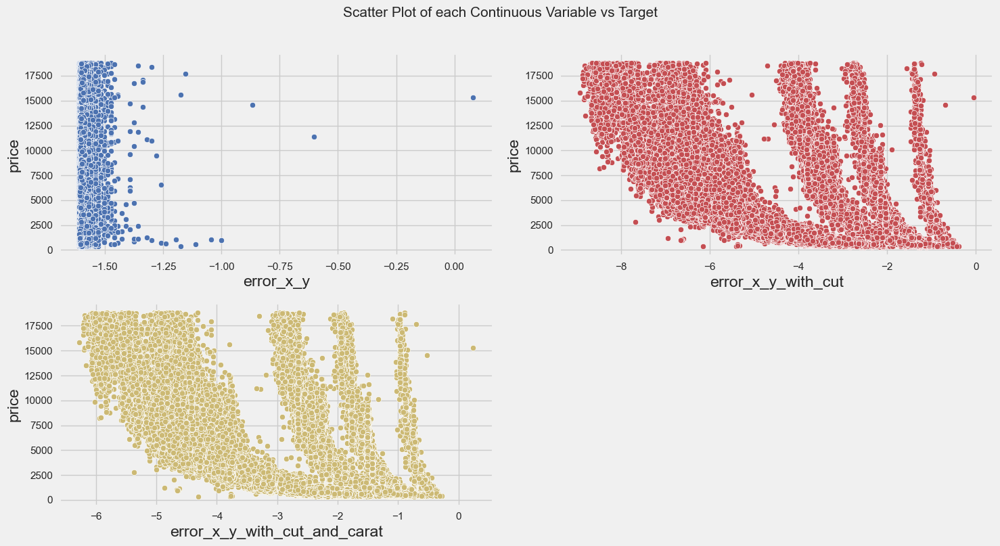

Number of All Scatter Plots = 6


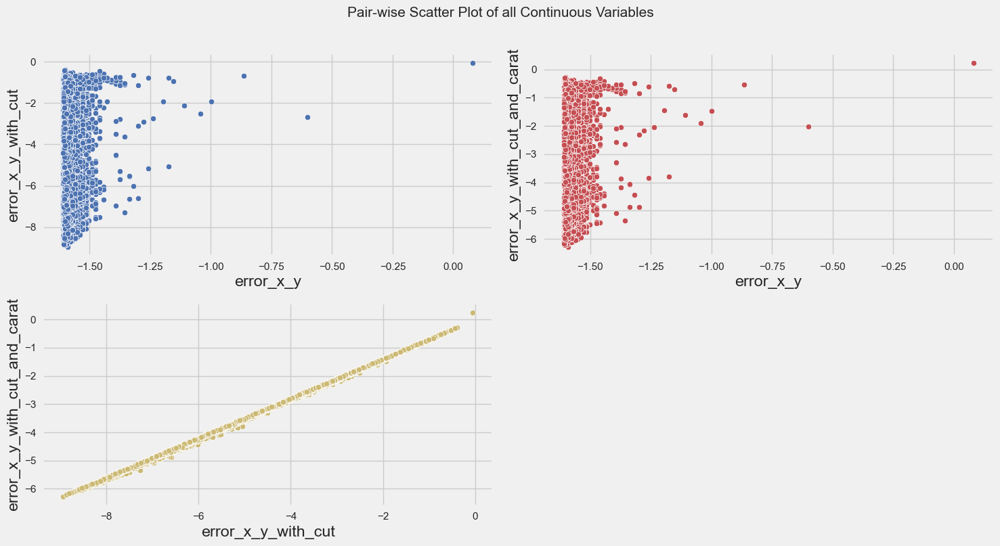

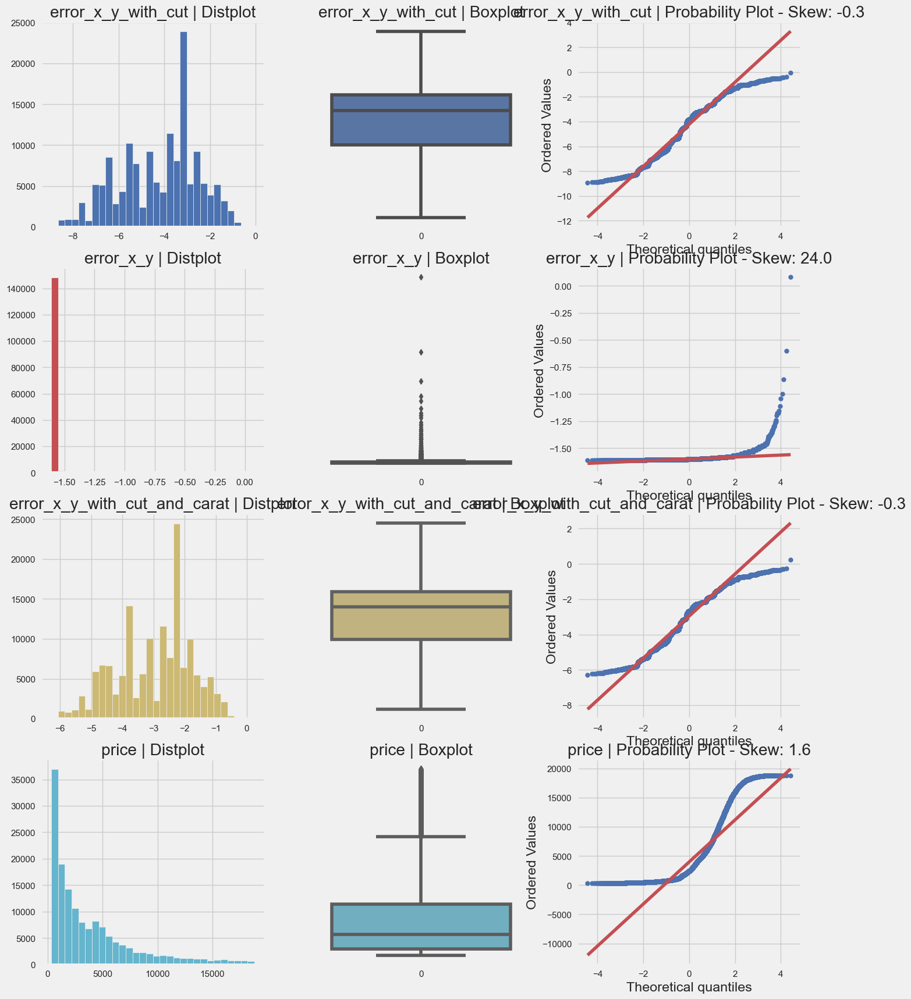

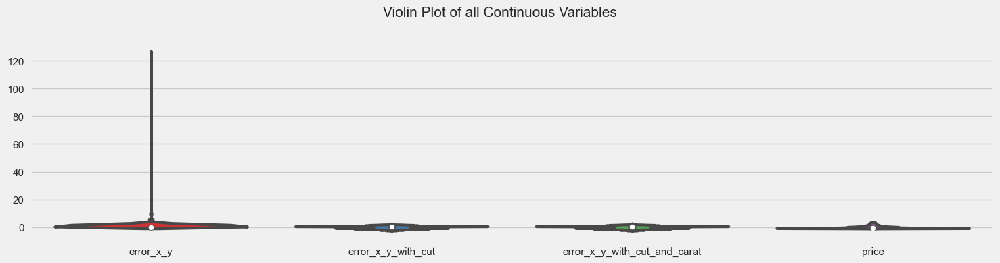

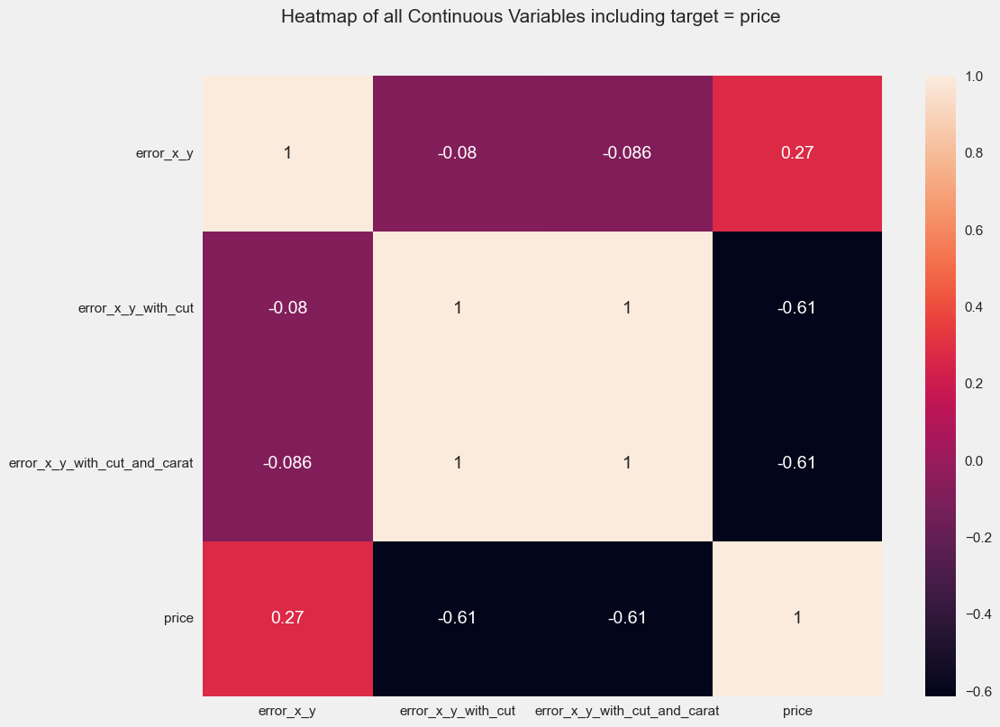

No categorical or boolean vars in data set. Hence no pivot plots...
No categorical or numeric vars in data set. Hence no bar charts.
All Plots done
Time to run AutoViz = 7 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [123]:
%matplotlib inline
_ = AV.AutoViz(
    "",
    depVar = "price",
    dfte = pd.concat([X,y], axis = 1)[["error_x_y","error_x_y_with_cut","error_x_y_with_cut_and_carat"] + ["price"]],
    verbose = 1,
    lowess=False,
    chart_format="svg"
)

### Agregate variables

In [21]:
# quality measurement
quality_vars = ["cut","color","clarity"]

quality_transformer = MathFeatures(
        variables = quality_vars,
        func = ["sum","mean","prod"])

X = quality_transformer.fit_transform(X)

    Since nrows is smaller than dataset, loading random sample of 150000 rows into pandas...
Shape of your Data Set loaded: (150000, 7)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
prod_cut_color_clarity,59,float64,0,0.000000,0.590000,0,
sum_cut_color_clarity,17,float64,0,0.000000,0.170000,0,
mean_cut_color_clarity,17,float64,0,0.000000,0.170000,0,
color,7,int64,0,0.000000,0.070000,0,
clarity,7,int64,0,0.000000,0.070000,0,
cut,5,int64,0,0.000000,0.050000,0,


    6 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
Since Number of Rows in data 150000 exceeds maximum, randomly sampling 150000 rows for EDA...

################ Regression problem #####################


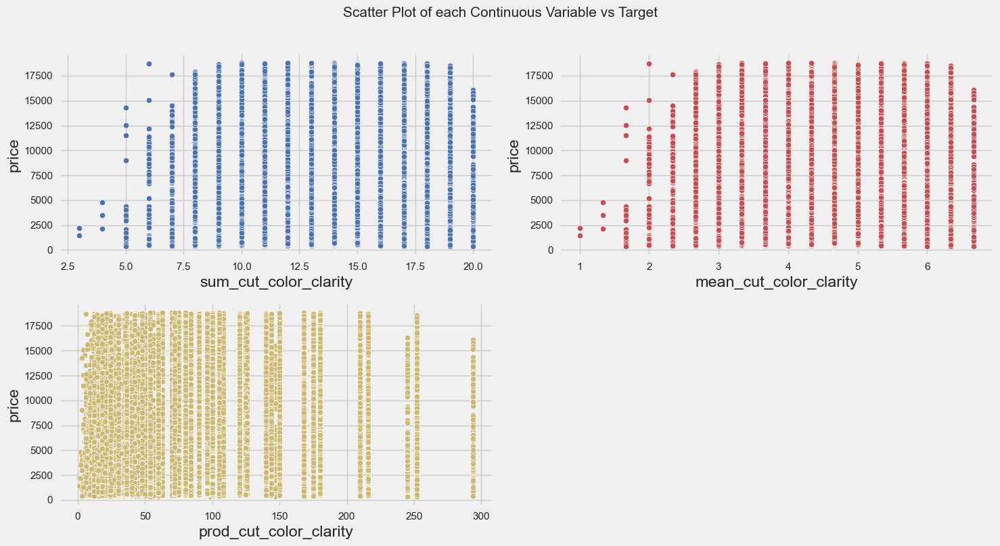

Number of All Scatter Plots = 6


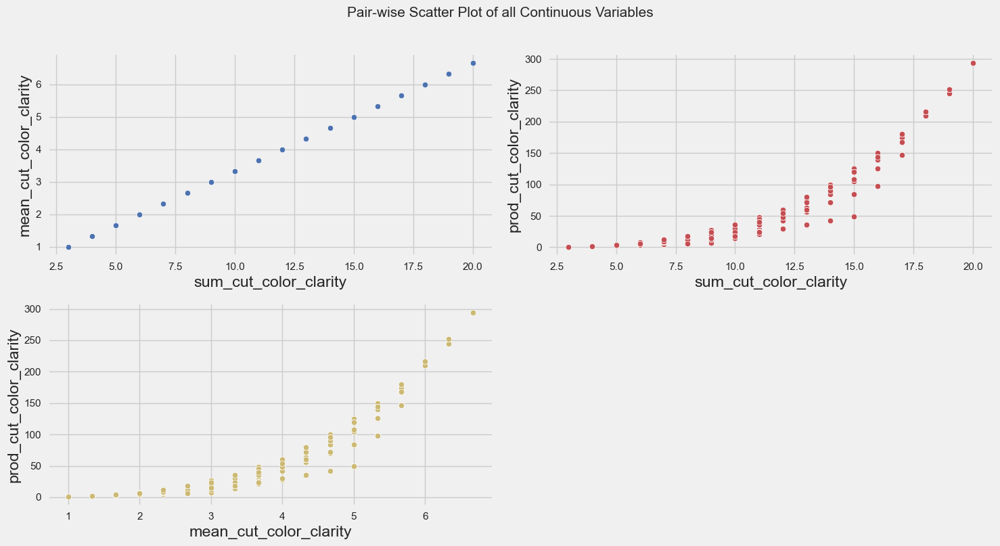

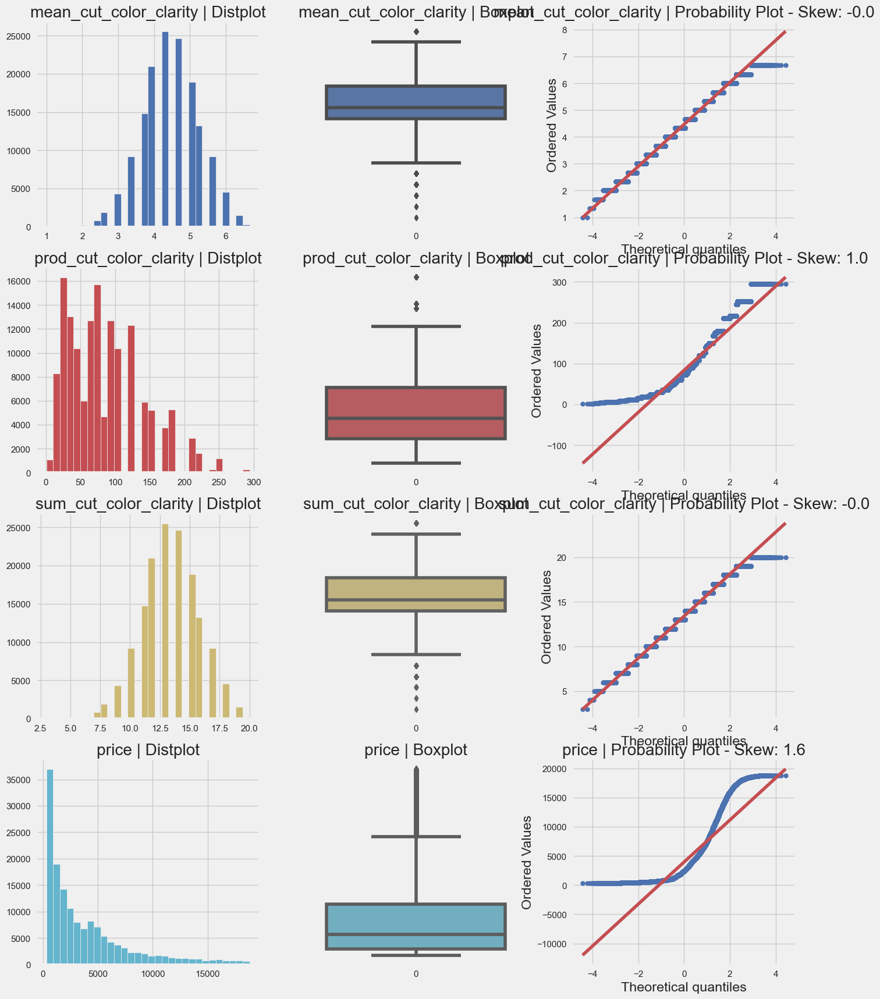

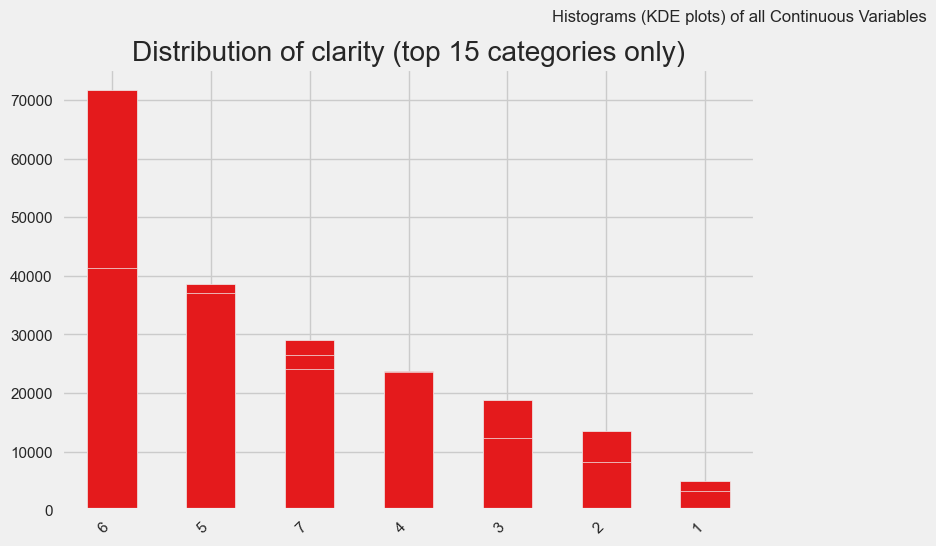

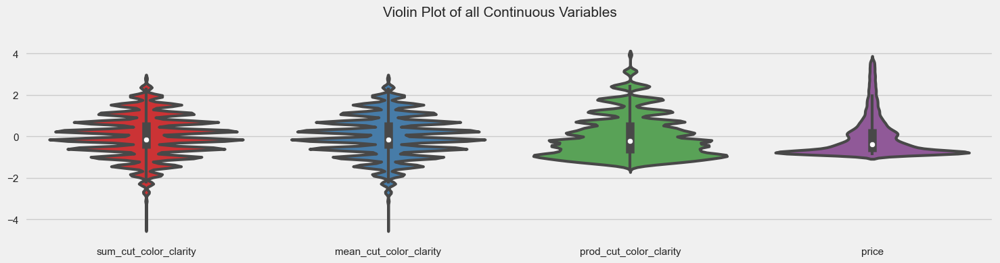

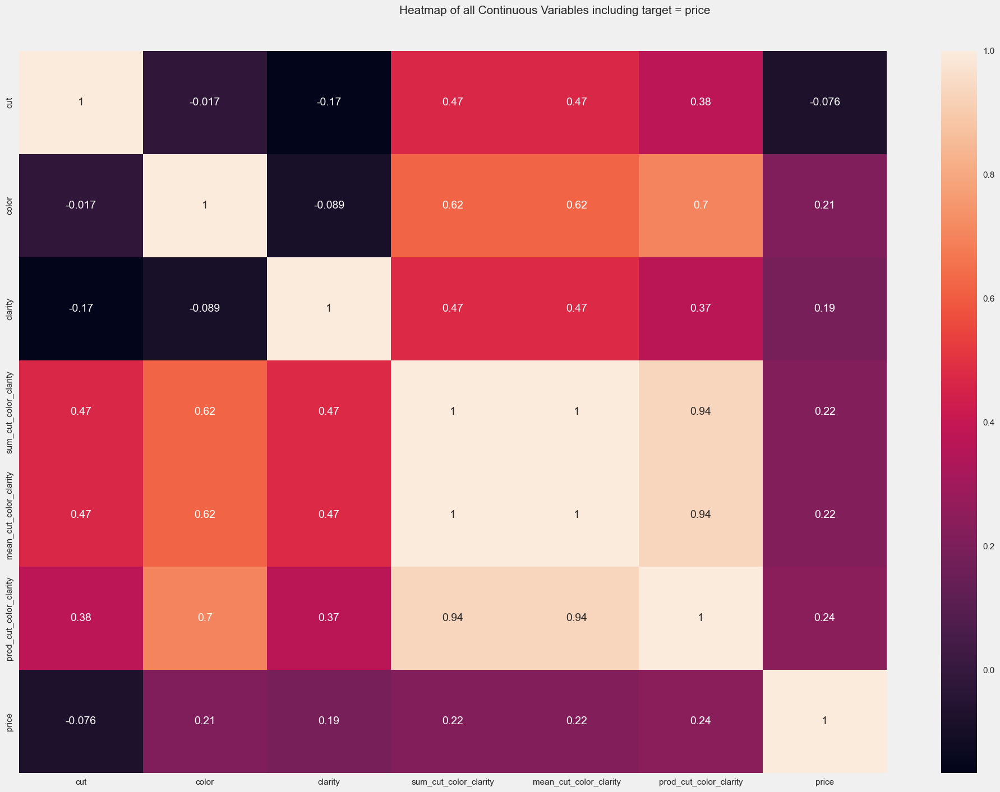

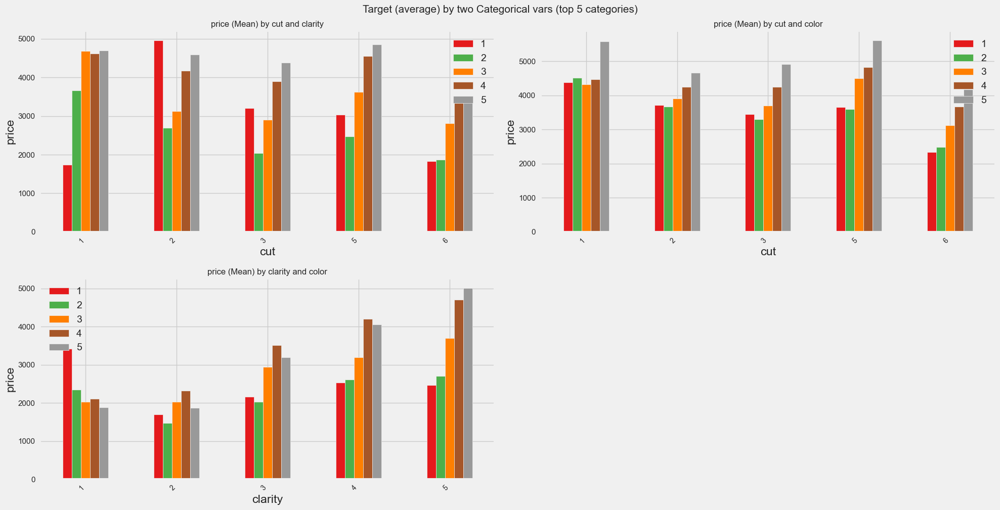

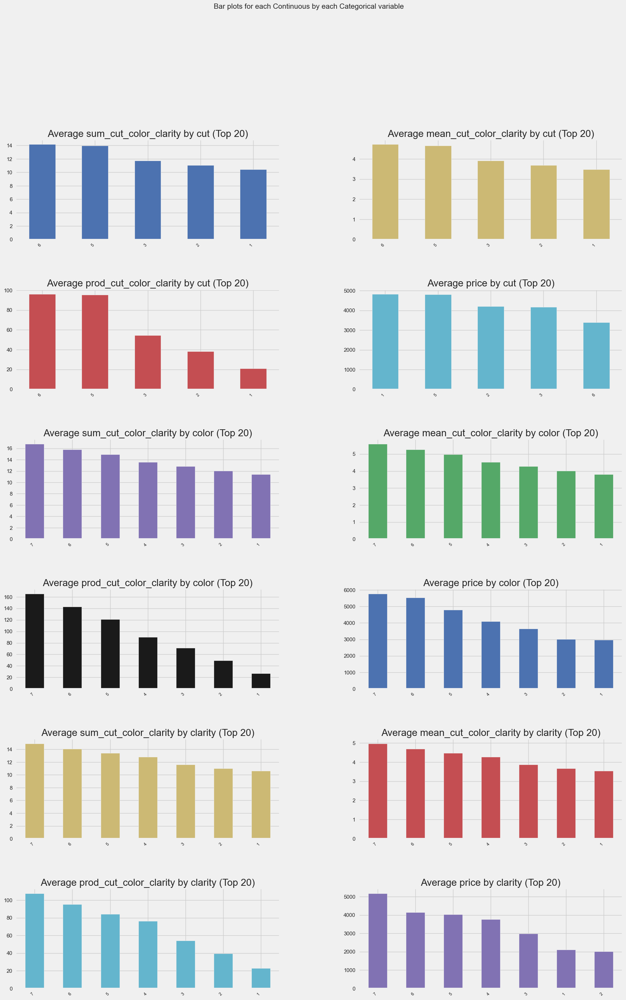

All Plots done
Time to run AutoViz = 10 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [22]:
%matplotlib inline
_ = AV.AutoViz(
    "",
    depVar = "price",
    dfte = pd.concat([X,y], axis = 1)[quality_vars + ['sum_cut_color_clarity','mean_cut_color_clarity','prod_cut_color_clarity'] + ["price"]],
    verbose = 1,
    lowess=False,
    chart_format="svg"
)

In [23]:
# We consider the cubic zirconia as cone
# Shape measurements of the cubic zirconia as cone

radious_vars = ["x","y"]
radious_transformer = MathFeatures(
        variables = radious_vars,
        func = lambda x: 1/4*(x.x + x.y),
        new_variables_names = ["radious"])

X = radious_transformer.fit_transform(X)

In [24]:
slant_height_vars = ["radious","z"]
slant_height_transformer = MathFeatures(
        variables = slant_height_vars,
        func = lambda x:np.sqrt(x.radious**2 + x.z**2),
        new_variables_names = ["slant_height"])

X = slant_height_transformer.fit_transform(X)

In [26]:
volumne_cone_vars = ["radious","z"]
volumne_cone_transformer = MathFeatures(
        variables = volumne_cone_vars,
        func = lambda x:1/3*((x.radious**2)*x.z*np.pi),
        new_variables_names = ["cone_volume"])

X = volumne_cone_transformer.fit_transform(X)

In [27]:
area_cone_vars = ["radious","slant_height"]
area_cone_transformer = MathFeatures(
        variables = area_cone_vars,
        func = lambda x:np.pi*x.radious*(x.radious+x.slant_height),
        new_variables_names = ["cone_area"])

X = area_cone_transformer.fit_transform(X)

    Since nrows is smaller than dataset, loading random sample of 150000 rows into pandas...
Shape of your Data Set loaded: (150000, 5)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
cone_volume,6316,float64,0,0.000000,63.160000,0,
cone_area,6308,float64,0,0.000000,63.080000,0,
slant_height,6264,float64,0,0.000000,62.640000,0,
radious,1073,float64,0,0.000000,10.730000,0,


    4 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
Since Number of Rows in data 150000 exceeds maximum, randomly sampling 150000 rows for EDA...

################ Regression problem #####################


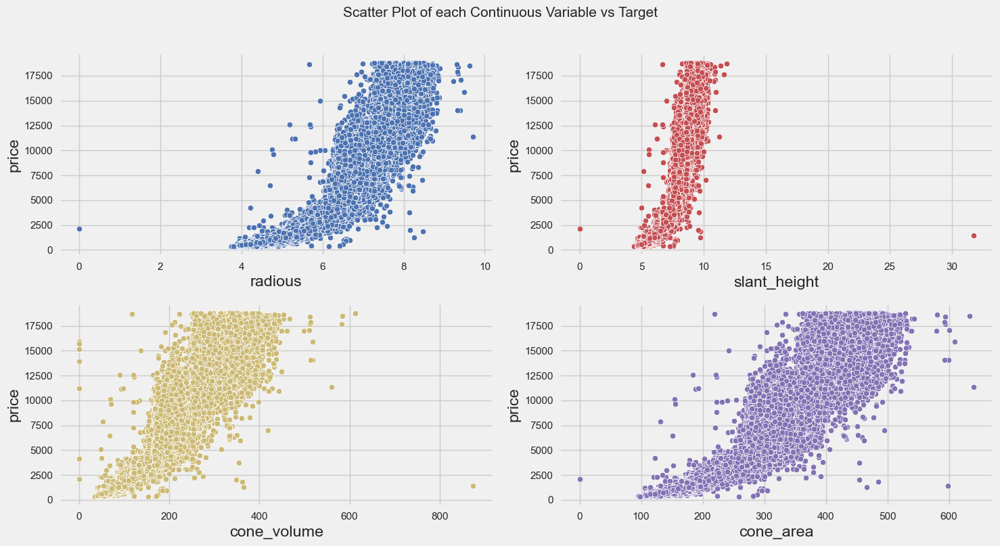

Number of All Scatter Plots = 10


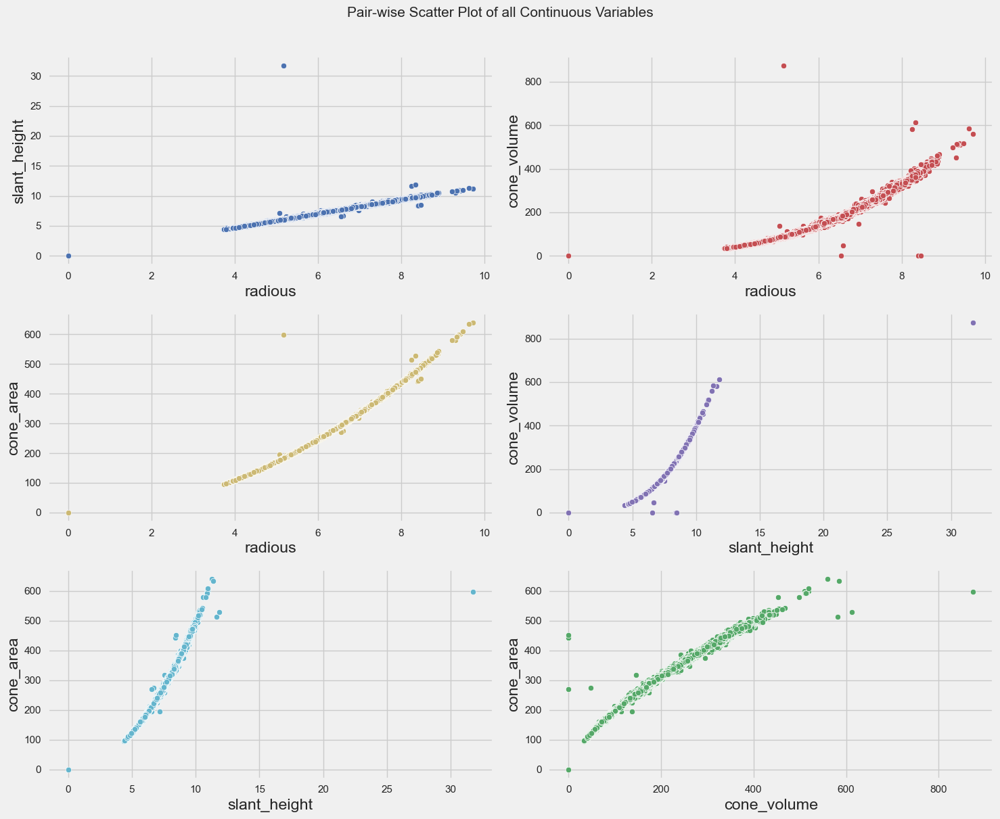

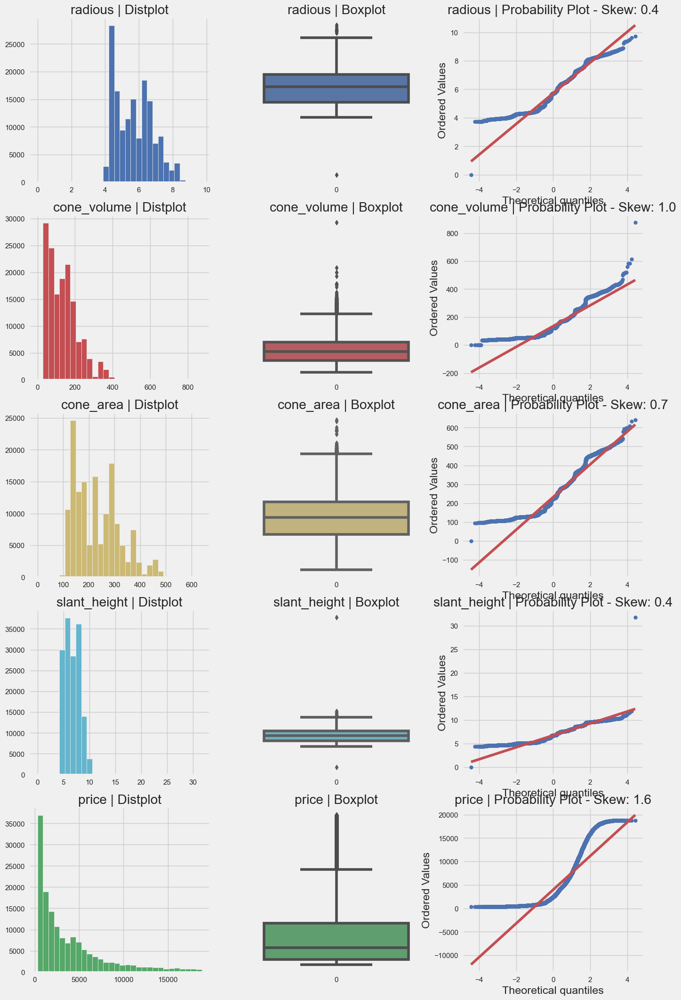

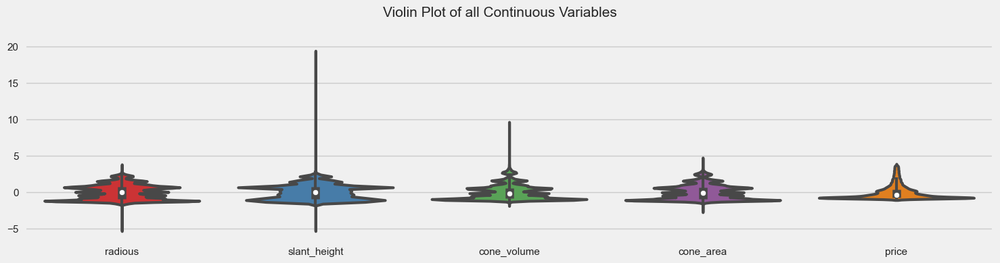

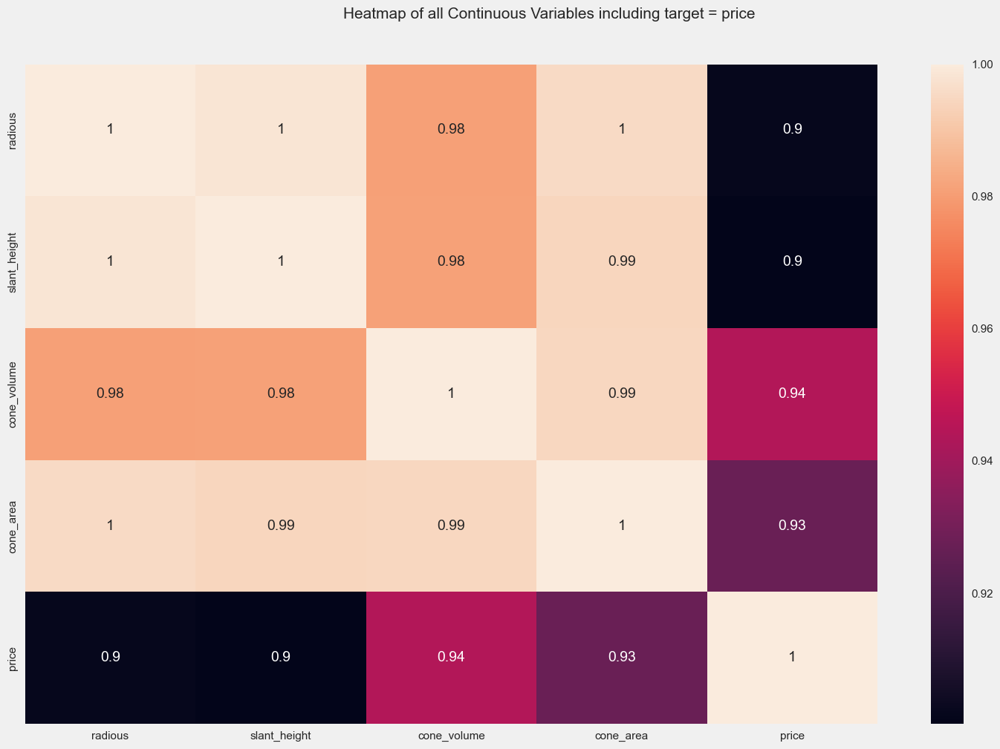

No categorical or boolean vars in data set. Hence no pivot plots...
No categorical or numeric vars in data set. Hence no bar charts.
All Plots done
Time to run AutoViz = 10 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [29]:
%matplotlib inline
_ = AV.AutoViz(
    "",
    depVar = "price",
    dfte = pd.concat([X,y], axis = 1)[["radious","slant_height","cone_volume","cone_area"] + ["price"]],
    verbose = 1,
    lowess=False,
    chart_format="svg"
)

In [31]:
average_girdle_diameter_vars = ["depth","z"]

average_girdle_diameter_transformer = MathFeatures(
        variables = average_girdle_diameter_vars,
        func = lambda x: x.z/x.depth,
        new_variables_names = ["average_girdle_diameter"])
X = average_girdle_diameter_transformer.fit_transform(X)

    Since nrows is smaller than dataset, loading random sample of 150000 rows into pandas...
Shape of your Data Set loaded: (150000, 4)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
average_girdle_diameter,4764,float64,0,0.000000,47.640000,0,
z,302,float64,0,0.000000,3.020000,0,
depth,102,float64,0,0.000000,1.020000,0,


    3 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
Since Number of Rows in data 150000 exceeds maximum, randomly sampling 150000 rows for EDA...

################ Regression problem #####################


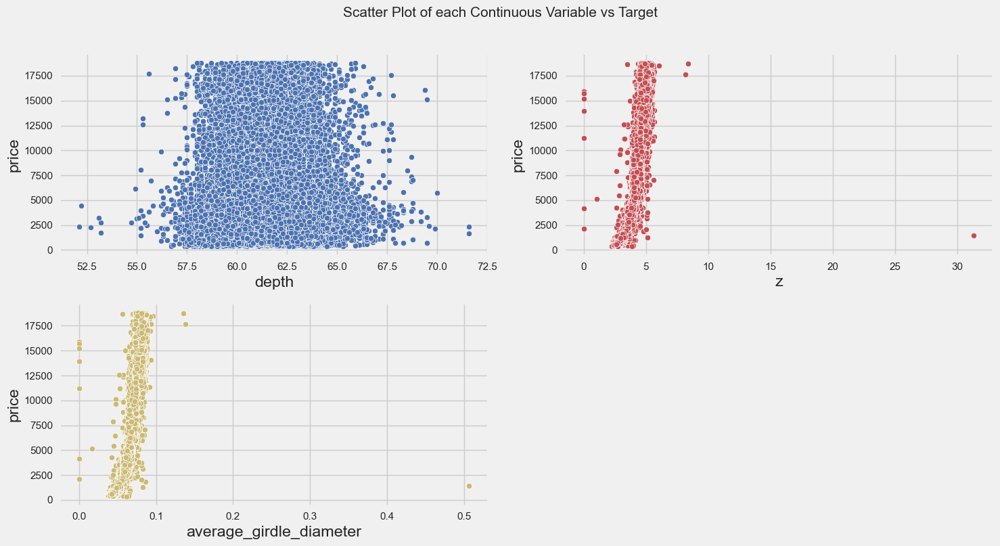

Number of All Scatter Plots = 6


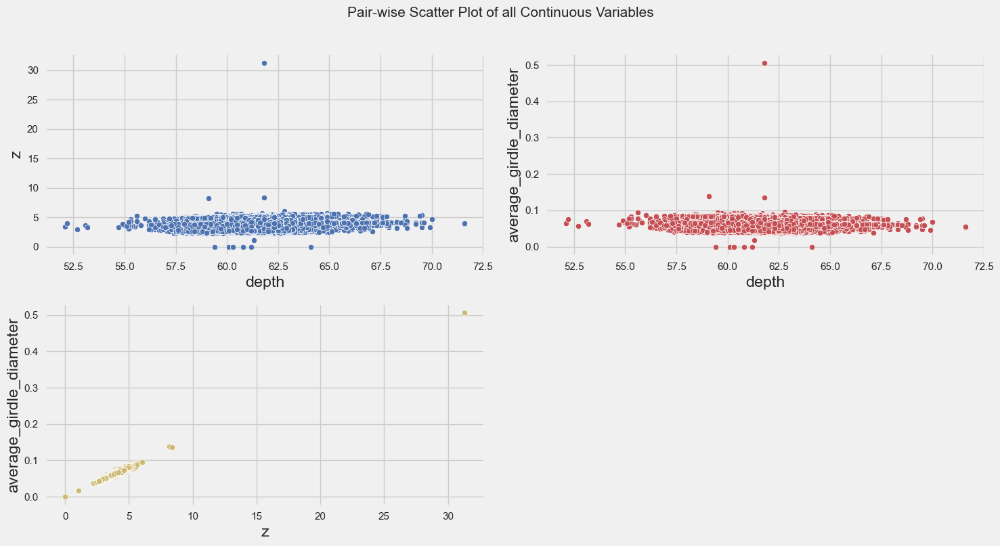

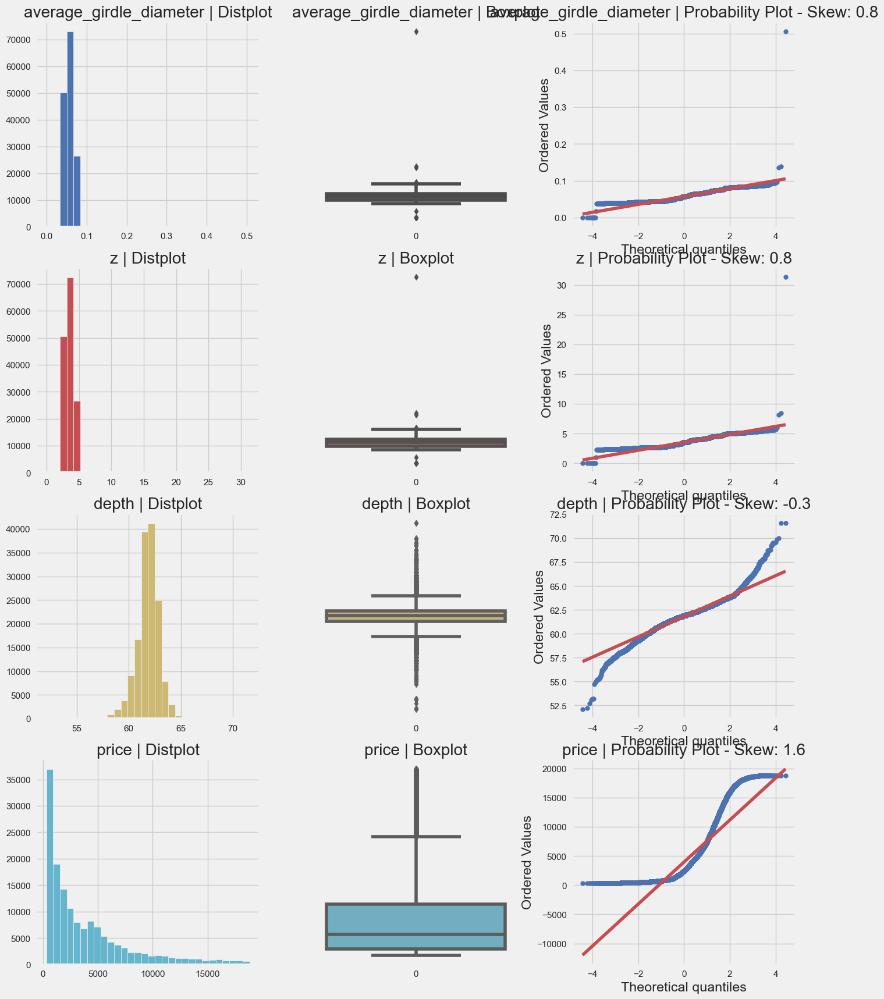

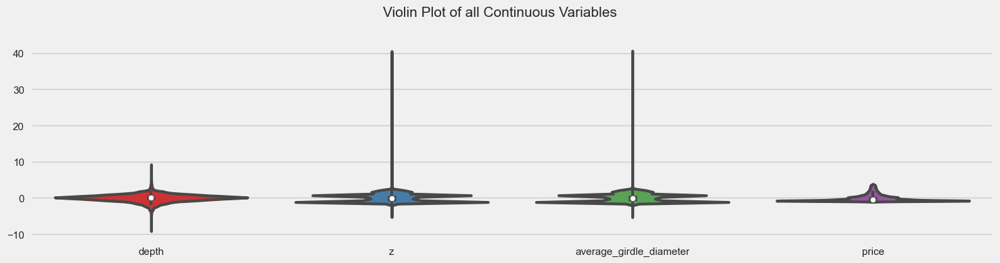

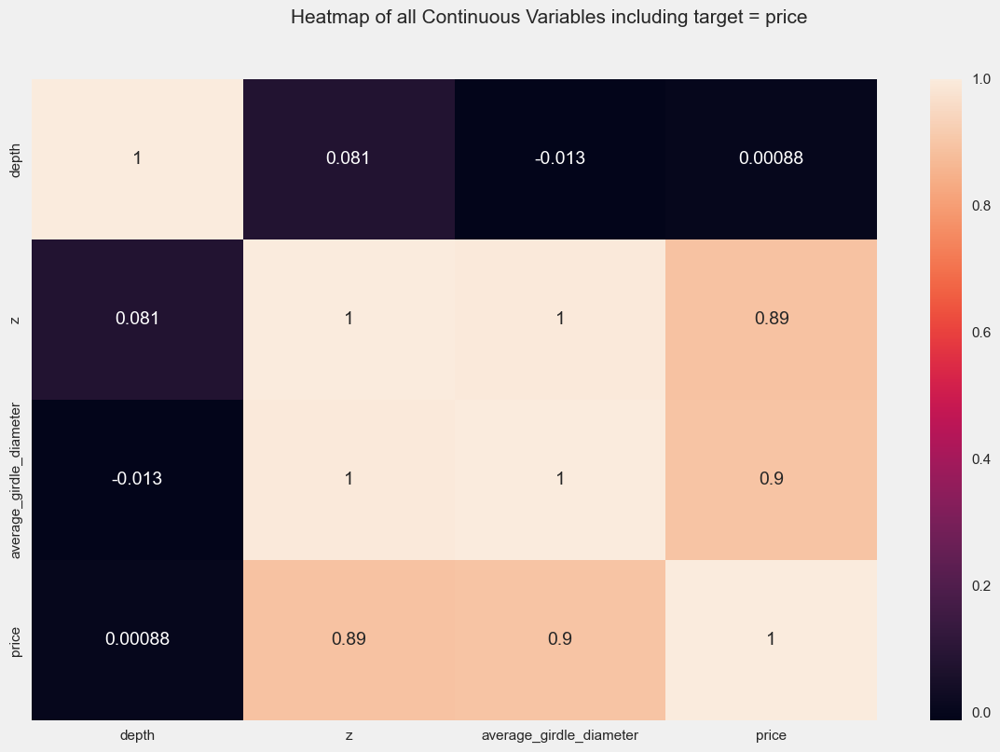

No categorical or boolean vars in data set. Hence no pivot plots...
No categorical or numeric vars in data set. Hence no bar charts.
All Plots done
Time to run AutoViz = 8 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [33]:
%matplotlib inline
_ = AV.AutoViz(
    "",
    depVar = "price",
    dfte = pd.concat([X,y], axis = 1)[average_girdle_diameter_vars + ['average_girdle_diameter'] + ["price"]],
    verbose = 1,
    lowess=False,
    chart_format="svg"
)

In [35]:
# Shape measurements
average_girdle_diameter_and_cone_area = ["cone_area","average_girdle_diameter"]

average_girdle_diameter_and_cone_area_transformer = MathFeatures(
        variables = average_girdle_diameter_and_cone_area,
        func = "prod",
        new_variables_names = ["average_girdle_diameter_and_cone_area"])

X = average_girdle_diameter_and_cone_area_transformer.fit_transform(X)

    Since nrows is smaller than dataset, loading random sample of 150000 rows into pandas...
Shape of your Data Set loaded: (150000, 4)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
average_girdle_diameter_and_cone_area,8277,float64,0,0.000000,82.770000,0,
cone_area,6308,float64,0,0.000000,63.080000,0,
average_girdle_diameter,4764,float64,0,0.000000,47.640000,0,


    3 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
Since Number of Rows in data 150000 exceeds maximum, randomly sampling 150000 rows for EDA...

################ Regression problem #####################


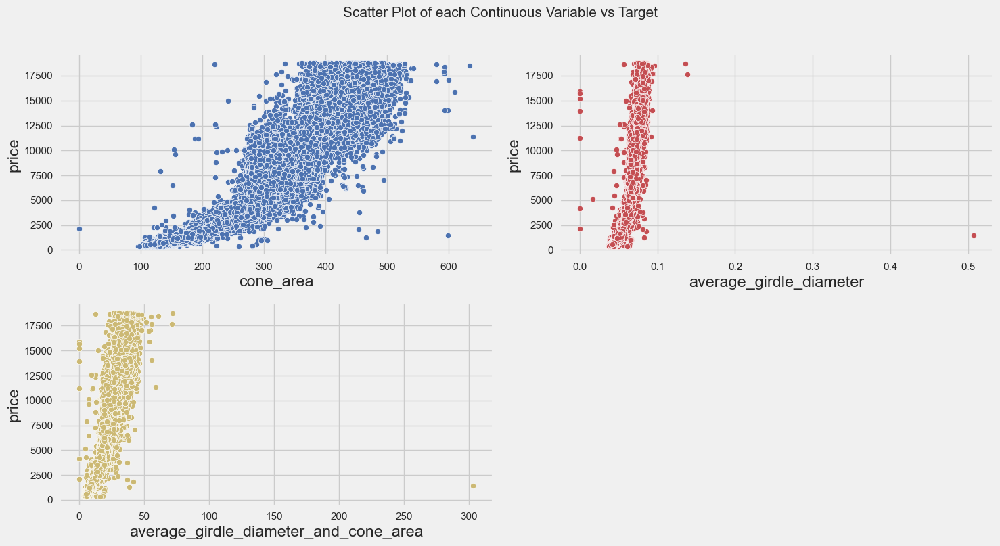

Number of All Scatter Plots = 6


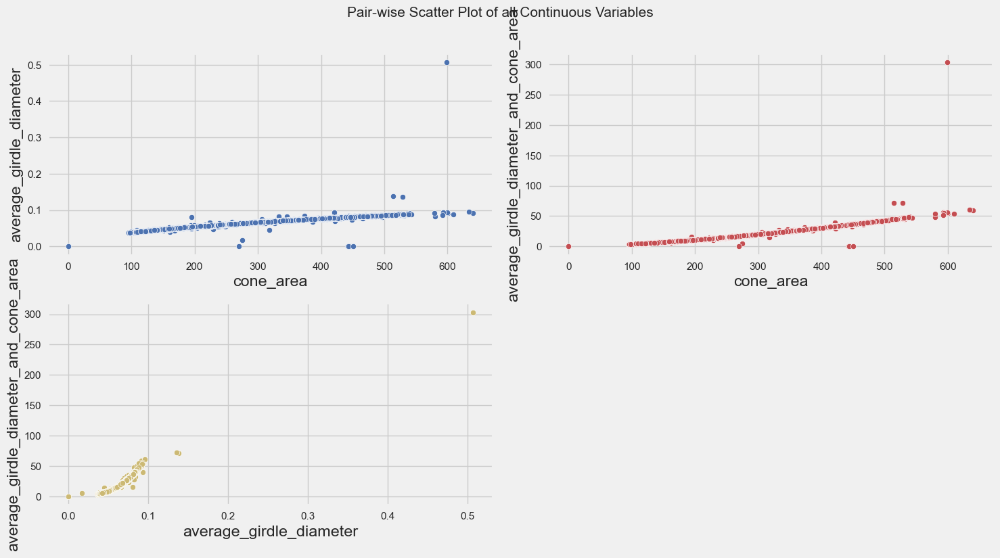

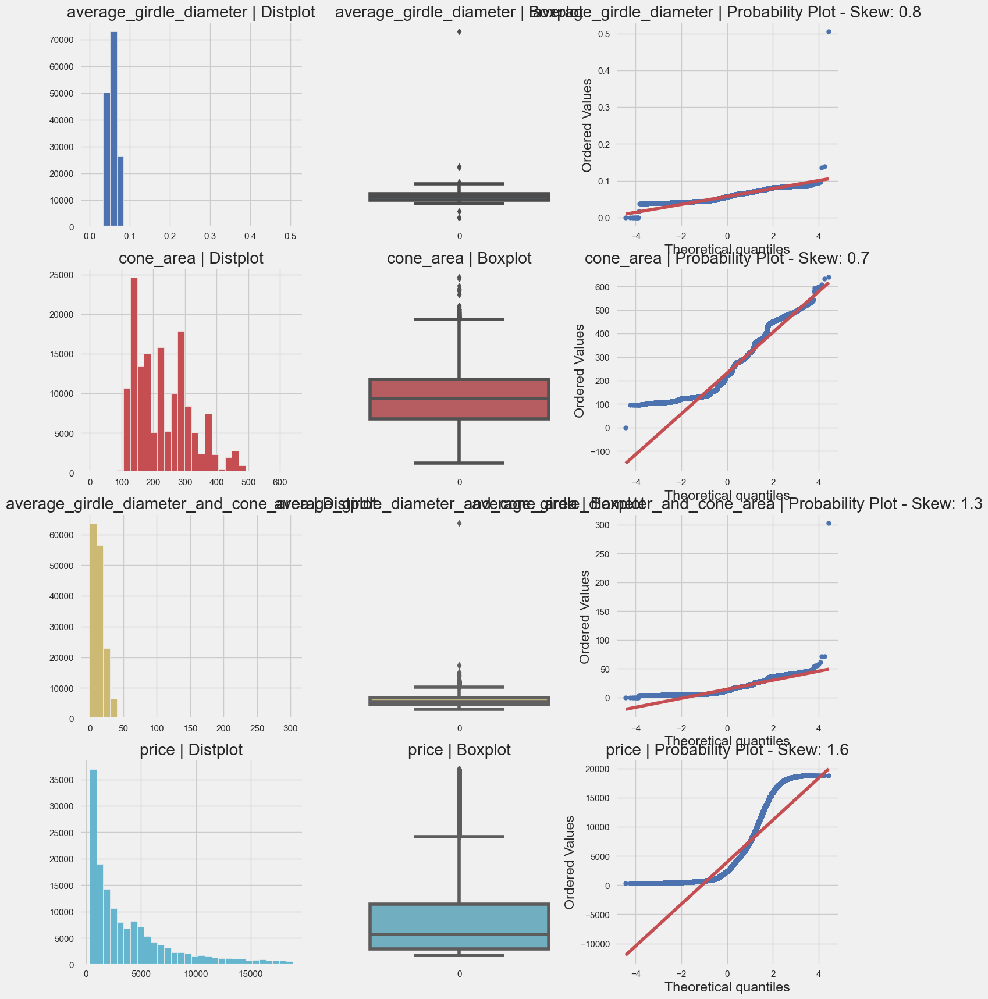

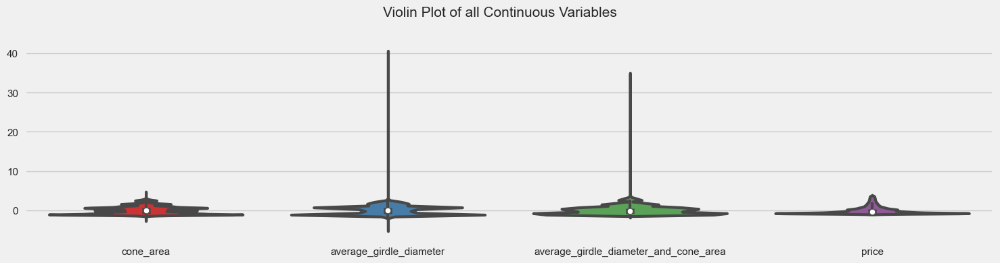

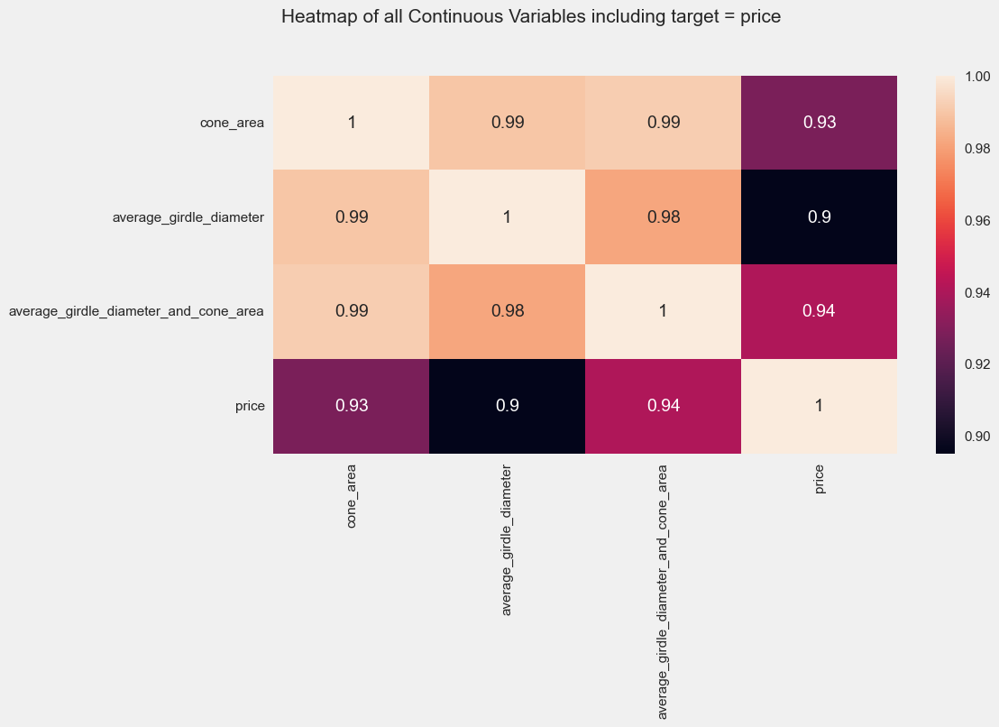

No categorical or boolean vars in data set. Hence no pivot plots...
No categorical or numeric vars in data set. Hence no bar charts.
All Plots done
Time to run AutoViz = 8 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [36]:
%matplotlib inline
_ = AV.AutoViz(
    "",
    depVar = "price",
    dfte = pd.concat([X,y], axis = 1)[average_girdle_diameter_and_cone_area + ['average_girdle_diameter_and_cone_area'] + ["price"]],
    verbose = 1,
    lowess=False,
    chart_format="svg"
)

In [40]:
density_vars = ["carat","cone_volume"]

density_transformer = MathFeatures(
        variables = density_vars,
        func = lambda x: x.carat/x.cone_volume,
        new_variables_names = ["density"])

X = density_transformer.fit_transform(X)

In [46]:
X.head()

,carat,cut,color,clarity,depth,table,x,y,z,sum_cut_color_clarity,mean_cut_color_clarity,prod_cut_color_clarity,radious,slant_height,cone_volume,cone_area,average_diameter,average_girdle_diameter,average_girdle_diameter_and_cone_area,density
0,0.555290,5,3,5,62.2,58.0,7.27,7.33,4.55,13.0,4.333333,75.0,7.300,8.601889,253.913467,364.687988,0.073151,0.073151,26.677337,0.002187
1,0.609005,3,7,7,62.0,58.0,8.06,8.12,5.05,17.0,5.666667,147.0,8.090,9.536802,346.112305,447.993724,0.081452,0.081452,36.489811,0.001760
2,0.391096,6,4,4,61.2,57.0,5.69,5.73,3.50,14.0,4.666667,96.0,5.710,6.697320,119.500268,222.568642,0.057190,0.057190,12.728599,0.003273
3,0.235654,6,4,4,61.6,56.0,4.38,4.41,2.71,14.0,4.666667,96.0,4.395,5.163344,54.817051,131.974925,0.043994,0.043994,5.806040,0.004299
4,0.576819,5,4,5,62.6,59.0,7.65,7.61,4.77,14.0,4.666667,100.0,7.630,8.998322,290.801119,398.586732,0.076198,0.076198,30.371545,0.001984


In [47]:
# Shape measurements
carat_and_quality_vars = ["carat","prod_cut_color_clarity"]


carat_and_quality_transformer = MathFeatures(
        variables = carat_and_quality_vars,
        func = "prod")

X = carat_and_quality_transformer.fit_transform(X)

In [48]:
X.head()

,carat,cut,color,clarity,depth,table,x,y,z,sum_cut_color_clarity,mean_cut_color_clarity,prod_cut_color_clarity,radious,slant_height,cone_volume,cone_area,average_diameter,average_girdle_diameter,average_girdle_diameter_and_cone_area,density,prod_carat_prod_cut_color_clarity
0,0.555290,5,3,5,62.2,58.0,7.27,7.33,4.55,13.0,4.333333,75.0,7.300,8.601889,253.913467,364.687988,0.073151,0.073151,26.677337,0.002187,41.646784
1,0.609005,3,7,7,62.0,58.0,8.06,8.12,5.05,17.0,5.666667,147.0,8.090,9.536802,346.112305,447.993724,0.081452,0.081452,36.489811,0.001760,89.523777
2,0.391096,6,4,4,61.2,57.0,5.69,5.73,3.50,14.0,4.666667,96.0,5.710,6.697320,119.500268,222.568642,0.057190,0.057190,12.728599,0.003273,37.545243
3,0.235654,6,4,4,61.6,56.0,4.38,4.41,2.71,14.0,4.666667,96.0,4.395,5.163344,54.817051,131.974925,0.043994,0.043994,5.806040,0.004299,22.622793
4,0.576819,5,4,5,62.6,59.0,7.65,7.61,4.77,14.0,4.666667,100.0,7.630,8.998322,290.801119,398.586732,0.076198,0.076198,30.371545,0.001984,57.681869


## Dropping hight correlated variables

In [49]:
drop_corr_transformer =  DropCorrelatedFeatures(threshold=0.99)
X = drop_corr_transformer.fit_transform(X)

In [50]:
X.head()

,carat,cut,color,clarity,depth,table,z,sum_cut_color_clarity,prod_cut_color_clarity,cone_volume,prod_carat_prod_cut_color_clarity
0,0.555290,5,3,5,62.2,58.0,4.55,13.0,75.0,253.913467,41.646784
1,0.609005,3,7,7,62.0,58.0,5.05,17.0,147.0,346.112305,89.523777
2,0.391096,6,4,4,61.2,57.0,3.50,14.0,96.0,119.500268,37.545243
3,0.235654,6,4,4,61.6,56.0,2.71,14.0,96.0,54.817051,22.622793
4,0.576819,5,4,5,62.6,59.0,4.77,14.0,100.0,290.801119,57.681869
